# Machine Learning Operations - EDA

This notebook was developed by:

- Bruna Simões (20240491)
- Daniel Caridade (20211588)
- Leonardo Di Caterina (20240485)
- Marco Galão (r20201545)

# 1. Libraries Importation

__`Step 1`__ Import the necessary libraries.

In [1]:
# EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from difflib import get_close_matches
import plotly.express as px
from scipy.stats import chi2_contingency

# 2. Data Integration 

__`Step 2`__ Importing the dataset into the notebook, ignoring the first columns as it does not contain relevant information.

In [2]:
data = pd.read_csv('credit_card_transactions.csv')
data.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,2019-10-01 00:00:27,2235335206132667,fraud_Kilback LLC,grocery_pos,153.84,Maria,Rosales,F,6611 Parrish Garden Apt. 428,Waynesfield,...,-83.9585,2089,Building control surveyor,1963-06-22,81b643d4fcfa3f77741190da28e6e4ef,1349049627,40.440651,-84.263025,0,45871.0
1,2019-10-01 00:01:39,6011148190095209,fraud_Wiegand-Lowe,grocery_net,34.93,Terri,Bailey,F,508 Erin Mount,Daly City,...,-122.4780,107941,"Buyer, industrial",1991-10-04,754cdf1eeb40c654d775f78373208094,1349049699,36.729695,-123.359777,0,NaN
2,2019-10-01 00:02:57,2274911989136158,fraud_Emard Inc,gas_transport,68.21,Robert,Velazquez,M,3136 Silva Stream,Parker,...,-104.7216,84861,Materials engineer,1932-03-10,943599c000d645026a08004dd25a736b,1349049777,38.647355,-103.729796,0,NaN
3,2019-10-01 00:03:30,6595970453799027,"fraud_Schumm, Bauch and Ondricka",grocery_pos,137.15,Gina,Gomez,F,72030 Shelton Crossing Apt. 742,Stirling,...,-74.4968,2307,Science writer,1969-09-11,042a1eee692792b15a868bcf9249ad03,1349049810,41.546880,-74.610362,0,12777.0
4,2019-10-01 00:05:23,4220345354880,fraud_Wisozk and Sons,misc_pos,8.42,Patrick,Torres,M,27386 Snyder Station,Oxford,...,-83.2829,24840,Agricultural consultant,1960-01-20,6cc272cfac3948db8c4296f79557970e,1349049923,43.758154,-83.166616,0,48731.0


## 2.1. Data Description

The dataset contains obversations regarding the occurence of fraud in a certain transaction and contains the following features:

- `trans_date_trans_time`: Timestamp of the transaction.
- `cc_num`: Credit card number (hashed or anonymized).
- `merchant`: Merchant or store where the transaction occurred.
- `category`: Merchant or store where the transaction occurred.
- `amt`: Amount of the transaction.
- `first`: First name of the cardholder.
- `last`: Last name of the cardholder.
- `gender`: Gender of the cardholder.
- `street`: Name of the street where the cardholder resids.
- `city`: Name of the city where the cardholder resids.
- `state`: Name of the state where the cardholder resids.
- `zip`: Zip code of the residence of the cardholder.
- `lat`: Latitude coordinate of the transaction.
- `long`: Longitude coordinate of the transaction.
- `city_pop`: Population of the city where the transaction occurred.
- `job`: Occupation of the cardholder.
- `dob`: Date of birth of the cardholder.
- `trans_num`: Unique transaction number.
- `unix_time`: Unix timestamp of the transaction.
- `merch_lat`: Latitude coordinate of the merchant.
- `merch_long`: Longitude coordinate of the merchant.
- `is_fraud`: Indicator of whether the transaction is fraudulent (target feature).
- `merch_zipcode`: Zip code of the merchant.


# 3. Exploratory Data Analysis

## 3.1. Data Content

__`Step 3`__ Checking the number of rows and columns of the dataset.

In [3]:
data.shape

(68758, 23)

__`Step 4`__ Checking the features data types and non-missing observations.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68758 entries, 0 to 68757
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   trans_date_trans_time  68758 non-null  object 
 1   cc_num                 68758 non-null  int64  
 2   merchant               68758 non-null  object 
 3   category               68758 non-null  object 
 4   amt                    68758 non-null  float64
 5   first                  68758 non-null  object 
 6   last                   68758 non-null  object 
 7   gender                 68758 non-null  object 
 8   street                 68758 non-null  object 
 9   city                   68758 non-null  object 
 10  state                  68758 non-null  object 
 11  zip                    68758 non-null  int64  
 12  lat                    68758 non-null  float64
 13  long                   68758 non-null  float64
 14  city_pop               68758 non-null  int64  
 15  jo

In [5]:
1 - (58253/68758)

0.1527822217051107

__`Step 4.1`__ Checking in a direct way the total number of missing values in the dataset.

In [6]:
data.isna().sum()

trans_date_trans_time        0
cc_num                       0
merchant                     0
category                     0
amt                          0
first                        0
last                         0
gender                       0
street                       0
city                         0
state                        0
zip                          0
lat                          0
long                         0
city_pop                     0
job                          0
dob                          0
trans_num                    0
unix_time                    0
merch_lat                    0
merch_long                   0
is_fraud                     0
merch_zipcode            10505
dtype: int64

Based on this simple analysis we can depict the following insights:

- **Data dimensionality:** The dataset consists of 1,296,675 rows and 23 columns, providing a large volume of observations and a moderately high number of features. While this richness is beneficial for modeling, it also introduces potential challenges related to the curse of dimensionality, which can negatively impact model performance and increase computational complexity.

- **Data Types:** Most variables are correctly assigned to their respective data types. However, the `trans_date_trans_time` column, which represents temporal information, is currently stored as a string and should be converted to a datetime type for proper analysis and `zip` which while represented as numbers is a categorical feature. Additionally, some identifier fields appear as object types instead of integers because they have been hashed for anonymization.

- **Missing values:** All features have complete information with exception of `merch_zipe` that has **15.11%** of the observations with missing values.

## 3.2. Descriptive statistics

__`Step 5`__ Computing descriptive statistic for the numerical features.

In [7]:
data.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
count,6.875800e+04,68758.000000,68758.000000,68758.000000,68758.000000,6.875800e+04,6.875800e+04,68758.000000,68758.000000,68758.000000,58253.000000
mean,4.155610e+17,70.555679,48853.934306,38.527159,-90.218473,8.934147e+04,1.350407e+09,38.524503,-90.218132,0.006603,46945.509416
std,1.306340e+18,141.200601,26785.659639,5.062024,13.644147,3.040116e+05,7.532275e+05,5.097096,13.655406,0.080990,25770.393536
min,6.041621e+10,1.000000,1257.000000,20.027100,-165.672300,2.300000e+01,1.349050e+09,19.034282,-166.657174,0.000000,1002.000000
25%,1.800466e+14,9.720000,26292.000000,34.571500,-96.809400,7.430000e+02,1.349729e+09,34.685569,-96.928359,0.000000,25422.000000
50%,3.520550e+15,47.650000,48193.000000,39.346500,-87.591700,2.443000e+03,1.350405e+09,39.357277,-87.491772,0.000000,46036.000000
75%,4.642255e+15,83.490000,72011.000000,41.894800,-80.185900,2.032800e+04,1.351078e+09,41.955282,-80.299109,0.000000,68413.000000
max,4.992346e+18,9092.750000,99783.000000,65.689900,-67.950300,2.906700e+06,1.351728e+09,66.582611,-66.996552,1.000000,99403.000000


__`Step 5.1`__ Computing Descriptive Statistics for the categorical features.

In [8]:
data.describe(include='O')

,trans_date_trans_time,merchant,category,first,last,gender,street,city,state,job,dob,trans_num
count,68758,68758,68758,68758,68758,68758,68758,68758,68758,68758,68758,68758
unique,67755,693,14,337,466,2,912,839,50,477,898,68758
top,2019-10-06 18:26:55,fraud_Kilback LLC,gas_transport,Christopher,Smith,F,27479 Reeves Dale,Phoenix,TX,Film/video editor,1977-03-23,d6deedc8b601f0d08be1854967630229
freq,3,234,6859,1325,1544,37764,189,285,5073,523,310,1


From the descriptive statistics we conclude that:

**Numerical Features**

- Only 0.58% (mean = 0.0058) of transactions are fraudulent, indicating a highly imbalanced dataset, which is typical in fraud detection problems, but will require some oversampling or undersampling techniques to ensure the model is capable of correclty predicting fradulent cases.
- The average transaction amount is approximately $70.35, but the maximum reaches $28,948.90, showing significant variance in spending behavior, which gives the hint that outliers should be present in the data.
- The latitude and longitude values for both users and merchants are mostly centered around continental U.S. ranges, confirming the dataset likely covers transactions within the U.S. Additionally, the near-identical means and standard deviations for lat/merch_lat and long/merch_long suggest transactions are mostly local.
- The median population is 2,456, and the mean is much higher (88,824), indicating a right-skewed distribution where most transactions occur in small to medium-sized towns, but some happen in very large cities.
- The unix_time field ranges between ~1.32B and ~1.37B, which corresponds to dates around 2018–2020, assuming standard Unix timestamp interpretation. Which is coherent with the range of dates in the variable `trans_date_trans_time`.

**Categorical Features**

- There are 1,296,675 transactions and 1,274,791 unique timestamps, indicating that most transactions occurred at unique moments.
- There are 693 unique merchants, with the most common one being fraud_Kilback LLC, appearing 4,403 times.
- 14 distinct transaction categories are present, such as gas_transport, which is the most common and occurs 131,659 times.
- The common first name in the dataset is Christopher (appearing 26669 times) and the most common surname is Smith (appearing 28794 times). Moreover there are 352 unique first names and 481 unique surnames.
- There are only 2 genders in the dataset (M for male and F for female) where the most common is female with 709863 entries, meaning ~55% of customers are female.
- There are 983 unique streets, 894 unique cities demonstrating a relatively high geographic coverage of the U.S territory and there are 51 unique states which represents one more state than the 50 states that the U.S have.
- There are 494 unique job titles with the most common being `Film/video editor` with 9779 records.
- All 1296675 transaction IDs are unique, as expected.

## 3.3. Missing value analysis

__`Step 6`__ Checking if there are missing `merchmerch_zipcode` in a row, for merchant localions that have the same latitude and longitude.

In [9]:
# Step 1: Filter rows where merch_zipcode is missing
missing_zip = data[data['merch_zipcode'].isna()]

# Step 2: Merge with full dataset on matching latitude & longitude
# This will find matches with the same merchant location
merged = missing_zip.merge(
    data.dropna(subset=['merch_zipcode']),  # only rows where zip is present
    on=['merch_lat', 'merch_long'],
    how='inner',
    suffixes=('_missing', '_filled')
)

# Step 3: Show some examples
merged[['merch_lat', 'merch_long', 'merch_zipcode_missing', 'merch_zipcode_filled']].head()

,merch_lat,merch_long,merch_zipcode_missing,merch_zipcode_filled


__`Step 6.1`__ Checking the proportion of missing values per class of the target feature.

In [10]:
data.groupby('is_fraud')['merch_zipcode'].apply(lambda x: x.isna().mean())

is_fraud
0    0.152993
1    0.121145
Name: merch_zipcode, dtype: float64

__`Step 6.2`__ Checking what are the latitudes and longitudes of the merchantes with Zip Codes that are missing.

In [11]:
# Filter missing ZIP rows and drop duplicates by location
missing_geo = data[data['merch_zipcode'].isna()]
unique_locs = missing_geo[['merch_lat', 'merch_long']].drop_duplicates()

# Create a folium map centered around average lat/lon
map_center = [unique_locs['merch_lat'].mean(), unique_locs['merch_long'].mean()]
m = folium.Map(location=map_center, zoom_start=5)

# Add a marker cluster for better performance with many points
marker_cluster = MarkerCluster().add_to(m)

# Add each unique location
for _, row in unique_locs.iterrows():
    folium.Marker(
        location=[row['merch_lat'], row['merch_long']],
        icon=folium.Icon(color='red'),
        popup='Missing ZIP'
    ).add_to(marker_cluster)

# Show the map (works best in Jupyter)
m

__`Step 6.3`__ Checking if there is a gender that tends to make transactions in places were the merchant zip code is missing.

In [12]:
# Step 1: Create a column indicating whether ZIP is missing
data['zip_missing'] = data['merch_zipcode'].isna()

# Step 2: Group by gender and calculate missing ZIP % per gender
gender_missing_zip = data.groupby('gender')['zip_missing'].mean().sort_values(ascending=False)

# Step 3: Display the result as percentages
print((gender_missing_zip * 100).round(2))

gender
F    15.54
M    14.96
Name: zip_missing, dtype: float64


From this analysis we conclude that:

- There are no instances where the same merchant location has both missing and non-missing ZIP codes across different transactions, indicating consistent missingness for affected locations.

- The proportion of missing merchant ZIP codes is relatively similar between fraudulent and non-fraudulent transactions, suggesting no strong correlation between ZIP code availability and fraud.

- A notable concentration of missing ZIP codes occurs in transactions located in Los Angeles and across California, potentially pointing to regional data quality issues.

- There is a slight gender-based difference: transactions made by female customers are about 1 percentage point more likely to involve merchants with missing ZIP codes. This may, however, be influenced by the higher number of female customers in the dataset.

## 3.4. Incoherences

__`Step 7`__ Checking for duplicate rows in the dataset.

In [13]:
# Total number of duplicate rows (excluding the first occurrence)
num_duplicates = data.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


__`Step 8`__ Checking if there are incoherences in the name of the merchants by taking out spaces and putting everything in lower_case.

In [14]:
data['merchant_lower'] = data['merchant'].str.strip()
data['merchant_lower'] = data['merchant_lower'].str.lower()
data['merchant'].nunique() / data['merchant_lower'].nunique()  # Check how many unique values ignoring case

1.0

__`Step 9`__ Checking if there are very similar names in the `merchant` feature to ensure it is consistent and does not have the same name but which a slight variation that is erroneous.

In [15]:
merchants = data['merchant'].unique()
get_close_matches('Walmart', merchants, n=5, cutoff=0.8)

[]

__`Step 10`__ Checking if there is any value similar to 'unknown' that might indicate missingness of data in the `merchant` feature.

In [16]:
# Convert to lowercase and strip whitespace for consistent comparison
merchant_cleaned = data['merchant'].str.lower().str.strip()

# List of common placeholders for missing data
placeholders = ['unknown', 'n/a', 'na', 'none', '-', '--', 'null', 'missing']

# Check for any of these placeholder values
placeholder_mask = merchant_cleaned.isin(placeholders)

# Count and inspect
print(f"Number of suspected placeholder values in 'merchant': {placeholder_mask.sum()}")
data[placeholder_mask].head()

Number of suspected placeholder values in 'merchant': 0


,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,zip_missing,merchant_lower


__`Step 11`__ Checking the possible values in the `category` feature.

In [17]:
data['category'].value_counts(dropna=False)

category
gas_transport     6859
home              6530
grocery_pos       6506
shopping_pos      6235
kids_pets         6030
shopping_net      5172
entertainment     4952
food_dining       4927
personal_care     4812
health_fitness    4621
misc_pos          4235
misc_net          3384
grocery_net       2368
travel            2127
Name: count, dtype: int64

__`Step 12`__ Checking if there are some sort of any type of unknown category in `first` and `last` presenting some sort of missingness.

In [18]:
# Clean the values by lowercasing and stripping
first_cleaned = data['first'].str.lower().str.strip()
last_cleaned = data['last'].str.lower().str.strip()

# Boolean masks
first_mask = first_cleaned.isin(placeholders)
last_mask = last_cleaned.isin(placeholders)

# Count potential invalid values
print(f"Suspected missing values in 'first': {first_mask.sum()}")
print(f"Suspected missing values in 'last': {last_mask.sum()}")

Suspected missing values in 'first': 0
Suspected missing values in 'last': 0


__`Step 13`__ Checking if there are cities that belong to non-U.S states.

In [19]:
# List of valid U.S. state abbreviations
us_states = {
    'AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'FL', 'GA',
    'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD',
    'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ',
    'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC',
    'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'
}

# Find rows with invalid or suspicious state codes
invalid_state_mask = ~data['state'].isin(us_states)

# Display suspicious cities and states
suspicious_locations = data[invalid_state_mask][['city', 'state']].drop_duplicates()
print(f"Found {len(suspicious_locations)} cities with potentially non-U.S. states:")
print(suspicious_locations)

Found 1 cities with potentially non-U.S. states:
           city state
196  Washington    DC


From this query, we observe that the data treats Washington, D.C. as the 51st state of the U.S. However, Washington, D.C. is not a state; it is a federal district created by the U.S. Constitution to serve as the nation's capital. Officially it is known as the District of Columbia, but operates independently of any state and is not part of Maryland or Virginia, even though it borders both.

__`Step 14`__ Checking if there are some sort of any type of unknown category in feature `job`.

In [20]:
# Convert all job titles to lowercase for consistent comparison
job_values = data['job'].str.lower()

# Check if any job entries match these placeholders
suspicious_jobs = job_values.isin(placeholders)

# Display the rows where job might indicate missingness
data[suspicious_jobs]

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,zip_missing,merchant_lower


__`Step 15`__ Checking if feature `dob` only has valid dates.

In [21]:
# Attempt to convert 'dob' to datetime and flag errors
invalid_dobs = pd.to_datetime(data['dob'], errors='coerce')

# Check how many were invalid (i.e., turned into NaT)
num_invalid = invalid_dobs.isna().sum()
print(f"Number of invalid 'dob' entries: {num_invalid}")

# Optionally, show the rows with invalid 'dob'
data[invalid_dobs.isna()]

Number of invalid 'dob' entries: 0


,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,...,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,zip_missing,merchant_lower


## 3.5. Univariate Feature Analysis

__`Step 16`__ Creating several list that contain the name of the dataset features for quick accessing.

In [22]:
numerical_features = ['trans_date_trans_time', 'amt', 'lat', 'long', 'city_pop', 'dob', 'merch_lat', 'merch_long']

categorical_features = ['merchant', 'category', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'job', 'unix_time', 
                        'merch_zipcode']

id_features = ['cc_num', 'trans_num']

target_feature = 'is_fraud'

categorical_features_high_cardinality = ['merchant', 'first', 'last', 'street', 'city', 'state', 'zip', 'job', 'unix_time', 'merch_zipcode']

categorical_features_low_cardinality = ['category', 'gender']

__`Step 17`__ Passing `trans_date_trans_time` and `dob` into date type.

In [23]:
# Convert to datetime format
data['trans_date_trans_time'] = pd.to_datetime(data['trans_date_trans_time'], errors='coerce')
data['dob'] = pd.to_datetime(data['dob'], errors='coerce')

# Check if there were any issues during conversion
print(f"Invalid 'trans_date_trans_time' entries: {data['trans_date_trans_time'].isna().sum()}")
print(f"Invalid 'dob' entries: {data['dob'].isna().sum()}")

Invalid 'trans_date_trans_time' entries: 0
Invalid 'dob' entries: 0


__`Step 18`__ Creating histograms and boxplots of the numerical features.

Creating histograms...


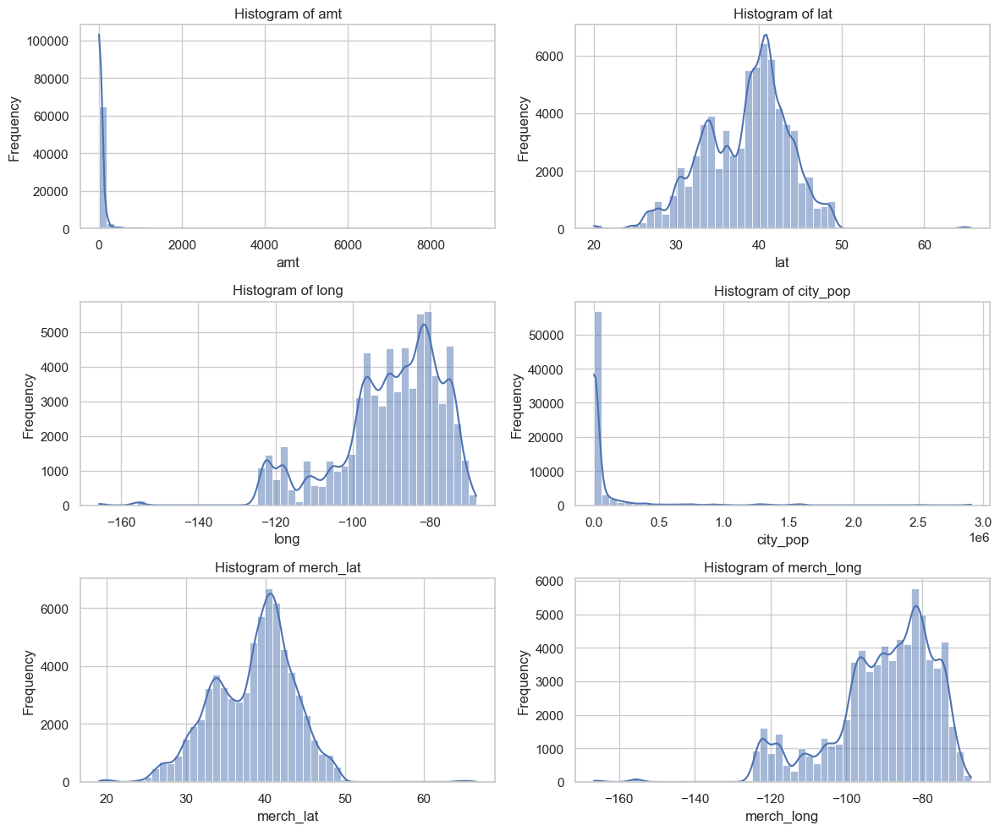

Creating boxplots...


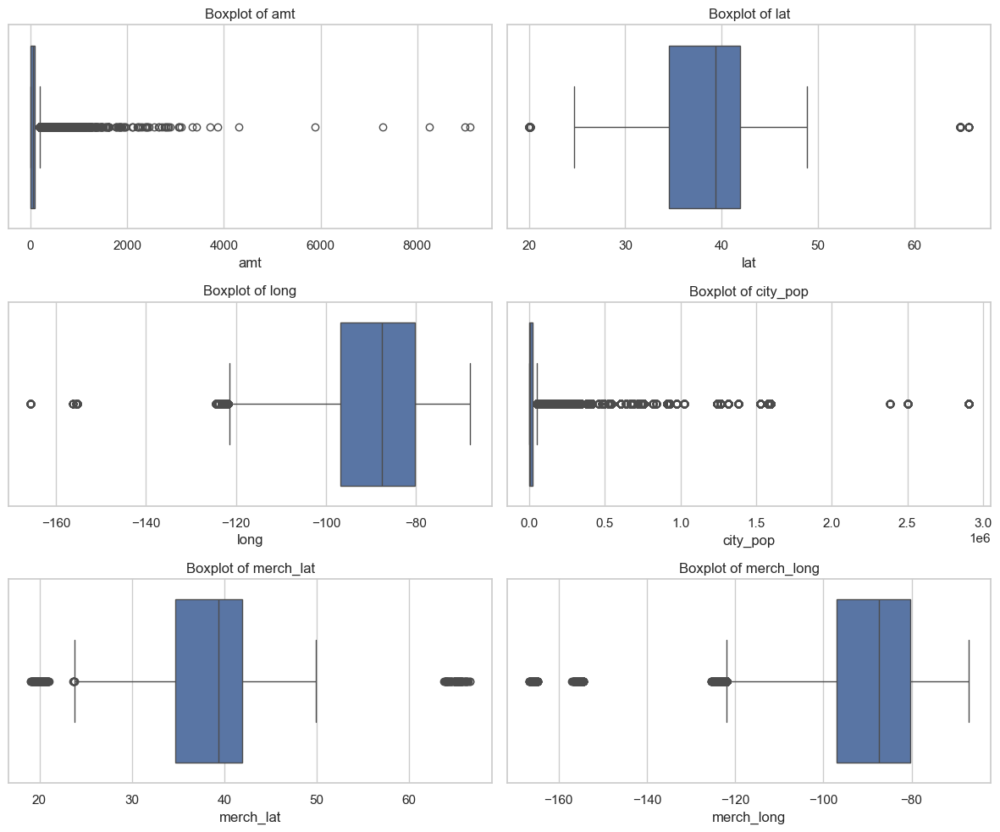

In [24]:
# Ensure datetime features are excluded from histograms and boxplots
plot_numerical_features = [col for col in numerical_features if col not in ['trans_date_trans_time', 'dob']]

# Set up the plot style
sns.set(style='whitegrid')

# Number of subplots
n_plots = len(plot_numerical_features)

# Create histograms in a 3x2 grid
print("Creating histograms...")
n_rows, n_cols = 3, 2  # 3 rows, 2 columns for the grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 10))  # Adjust the figure size

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i, col in enumerate(plot_numerical_features):
    sns.histplot(data[col], kde=True, bins=50, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

# Create boxplots in a 3x2 grid
print("Creating boxplots...")
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 10))  # Adjust the figure size

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i, col in enumerate(plot_numerical_features):
    sns.boxplot(x=data[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel(col)

# Adjust layout
plt.tight_layout()
plt.show()

__`Step 19`__ Creating bar plot of the categorical features with low cardinality.

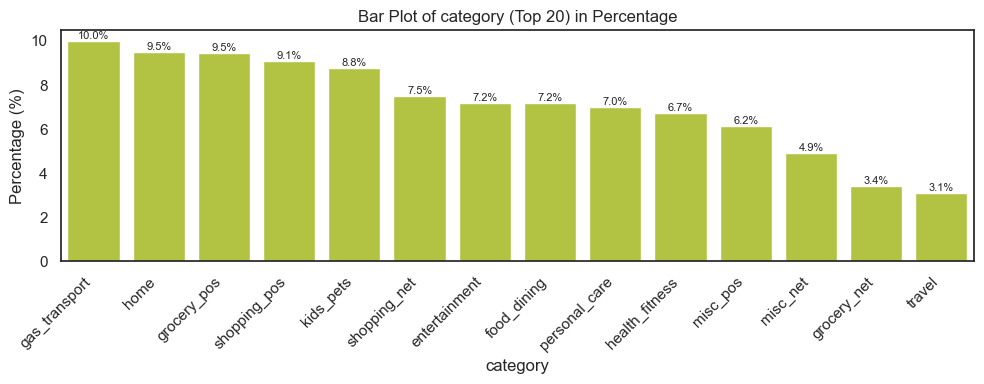

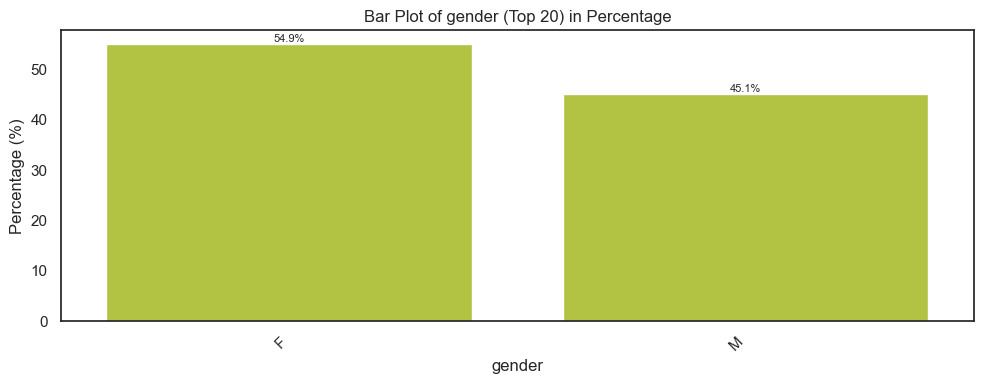

In [25]:
# Set plot style
sns.set(style='white')

# Loop through each low-cardinality categorical feature
for col in categorical_features_low_cardinality:
    plt.figure(figsize=(10, 4))

    # Limit to top 20 most common categories
    value_counts = data[col].value_counts().nlargest(20)

    # Calculate percentages
    total_count = value_counts.sum()
    percentages = (value_counts / total_count) * 100

    ax = sns.barplot(x=value_counts.index, y=percentages.values, color='#C1D82F')

    # Add percentage labels on top of the bars
    for i, percentage in enumerate(percentages.values):
        ax.text(i, percentage, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=8)

    plt.title(f'Bar Plot of {col} (Top 20) in Percentage')
    plt.ylabel('Percentage (%)')
    plt.xlabel(col)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

__`Step 20`__ Plotting the top 10 categories for the categories with high cardinality.

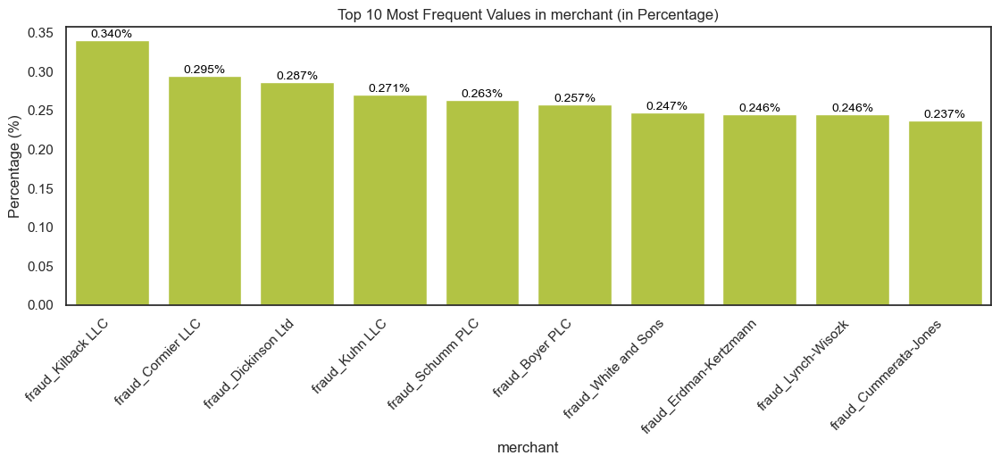

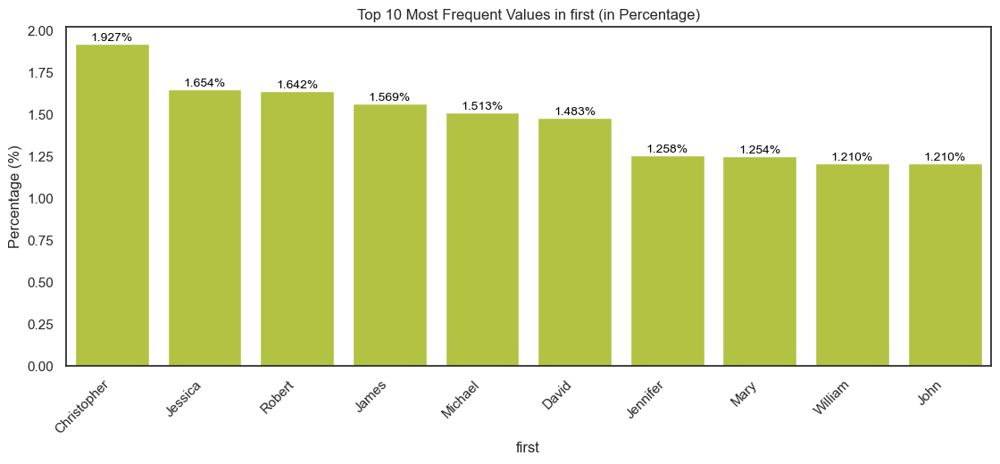

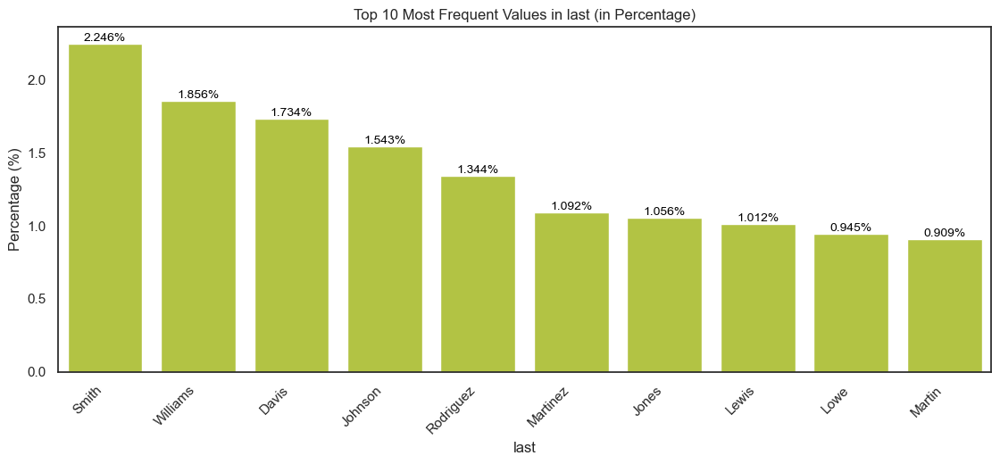

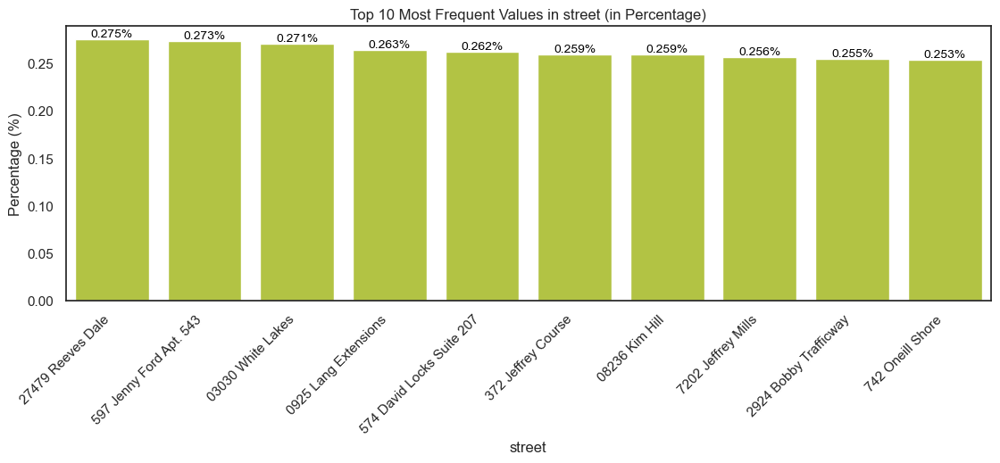

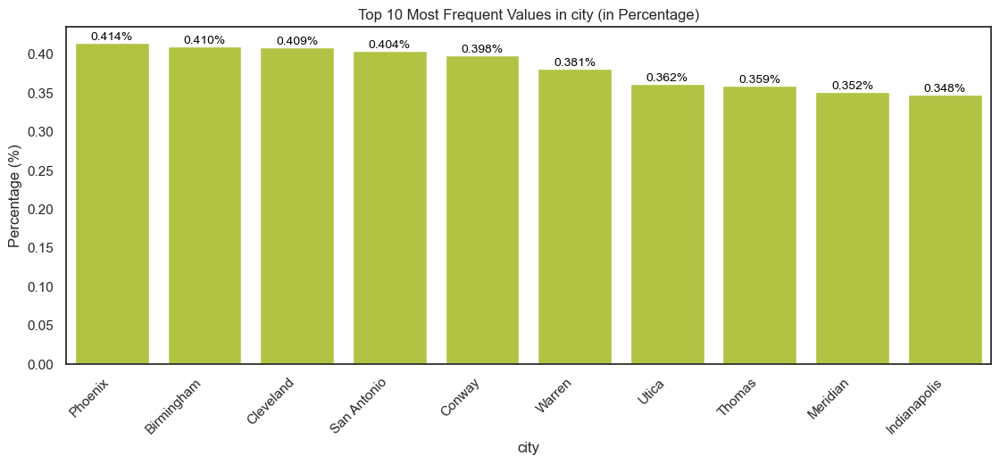

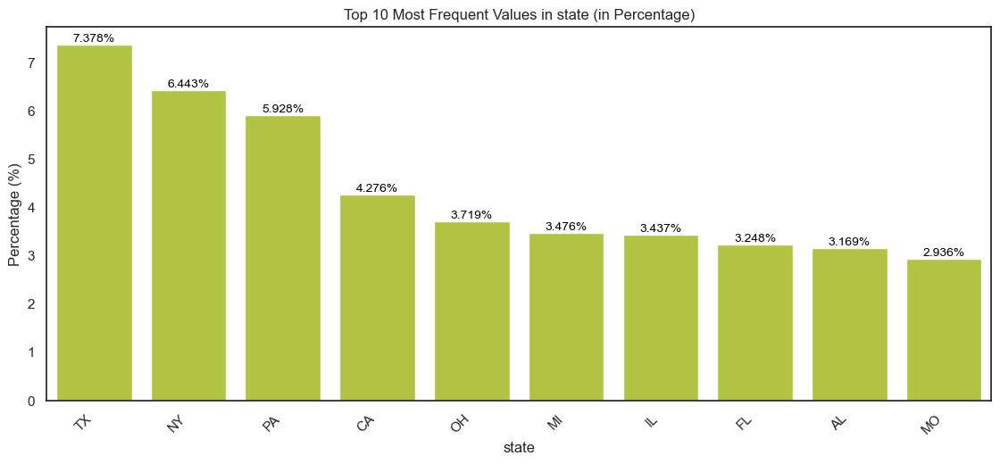

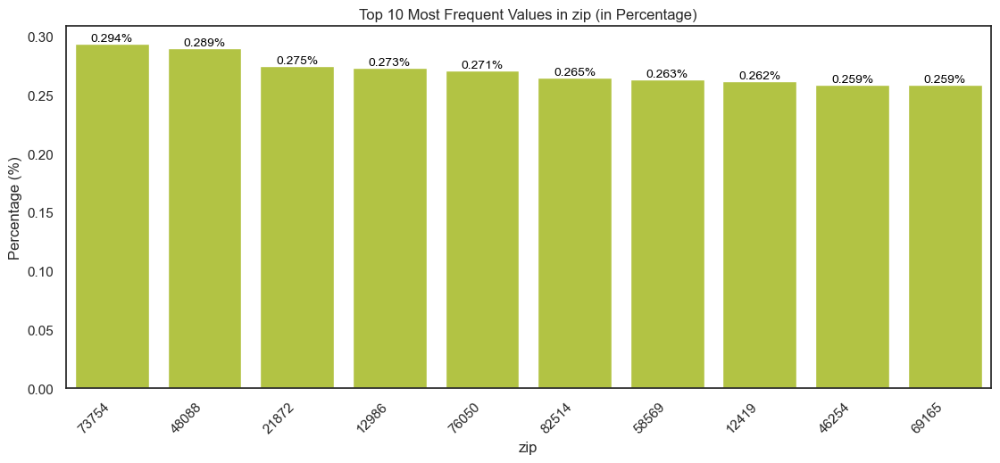

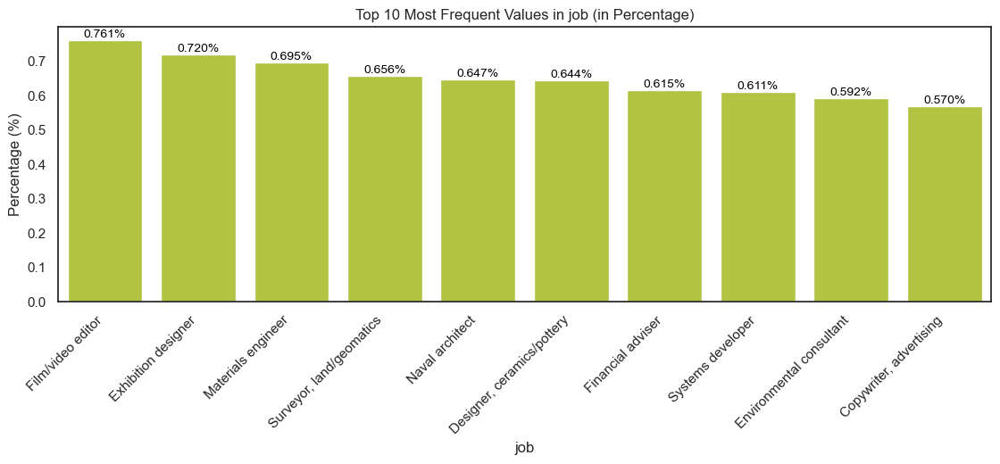

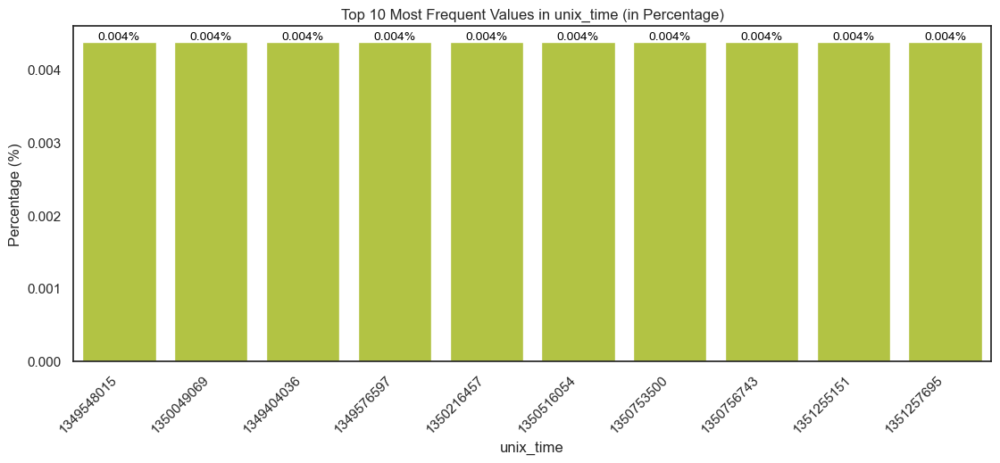

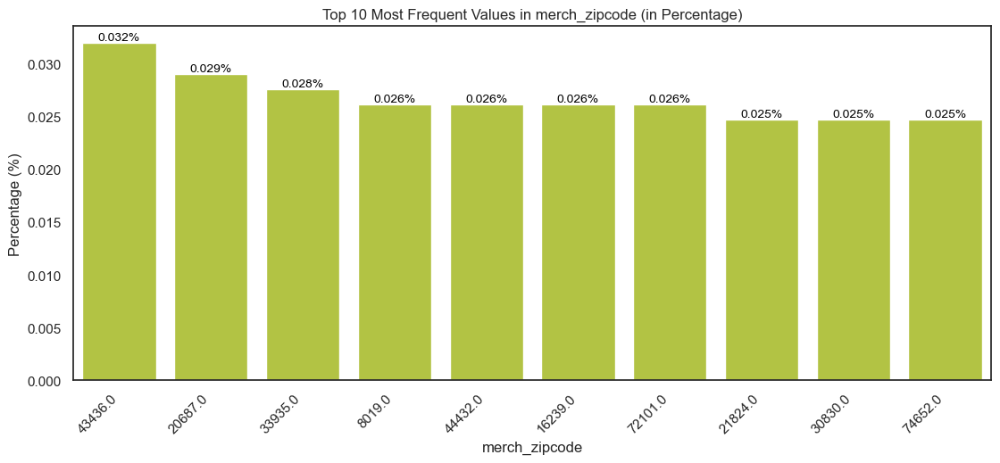

In [26]:
# Set plot style
sns.set(style='white')

# Loop through each high-cardinality categorical feature
for col in categorical_features_high_cardinality:
    plt.figure(figsize=(12, 6))
    
    # Take top 10 most frequent values
    top_10 = data[col].value_counts().nlargest(10)
    
    # Calculate percentages
    total_count = len(data[col])
    percentages = (top_10 / total_count) * 100
    
    # Create the barplot and ensure bars are ordered correctly
    ax = sns.barplot(x=top_10.index, y=percentages.values, color='#C1D82F', order=top_10.index)
    
    # Add percentage values on top of the bars
    for i, percentage in enumerate(percentages.values):
        ax.annotate(f'{percentage:.3f}%', 
                    (i, percentage), 
                    ha='center', va='bottom', 
                    fontsize=10, color='black')
    
    plt.title(f'Top 10 Most Frequent Values in {col} (in Percentage)')
    plt.ylabel('Percentage (%)')
    plt.xlabel(col)
    plt.xticks(rotation=45, ha='right')
    
    # Adjust the layout to make sure everything fits
    plt.tight_layout(pad=3.0)  # Increase padding to ensure labels are not cut off
    plt.show()

__`Step 21`__ Creating a map to see which state from the US as more transactions.

In [27]:
# Count the number of transactions per state
state_counts = data['state'].value_counts().reset_index()
state_counts.columns = ['state', 'transaction_count']

# Plot the choropleth map
fig = px.choropleth(
    state_counts,
    locations='state',
    locationmode='USA-states',  # Match state codes (e.g., TX, CA)
    color='transaction_count',
    color_continuous_scale='Blues',
    scope='usa',
    title='Number of Transactions per U.S. State'
)

fig.show()

From the univariate feature analysis we can depict:

- The majority of the features are right-skewed distributed, with only the latitude and longitude features having some sort of normal distribution, with longitude presenting some degree of left skewness.

- All the features present outliers that will need to be dealt with.

- The top three categories, gas_transport, grocery_pos, and home, each make up a significant portion of the data, with values around 9.5% to 10.2%.

- The dataset shows a slightly higher proportion of females (54.7%) compared to males (45.3%), with females making up a little more than half of the data.

- The top three merchants (fraud_Kilback LLC, fraud_Cormier LLC, and fraud_Schumm PLC) each contribute a small portion to the dataset, with percentages around 0.28% to 0.34%.

- Common first names like Christopher (2.06%), Robert (1.67%), and Jessica (1.59%) make up a small but notable portion of the dataset, with Christopher leading.

- Smith (2.22%), Williams (1.82%), and Davis (1.69%) are the most common last names in the dataset, with Smith being the most frequent.

- The top 10 streets each contribute 0.24% to the dataset, showing a fairly even distribution among the most frequent streets.

- The most frequent cities are Birmingham (0.43%), San Antonio (0.4%), and Utica (0.39%), with Birmingham being the most prominent.

- The top 3 clients in each zip code make up 0.28% of the transactions, with each contributing an equal share.~

- Popular jobs like Film/Video Editor (0.75%), Exhibition Designer (0.71%), and Naval Architect (0.67%) represent a small but noteworthy portion of the dataset.

- The state where more transactions were performed was Texas with 94.876K followed by New York with 83.501K transaction and Pennsylvania with 79.847K transactions being recorded.

- The states where less transactions were done are Delaware (9 transactions), Rhode Island (550 transactions) and Alaska (2120 transactions). 

## 3.6. Multivariate feature analysis

### 3.6.1. Pairwise relationship between the numerical features.

__`Step 22`__ Making a correlation matrix of the numerical features.

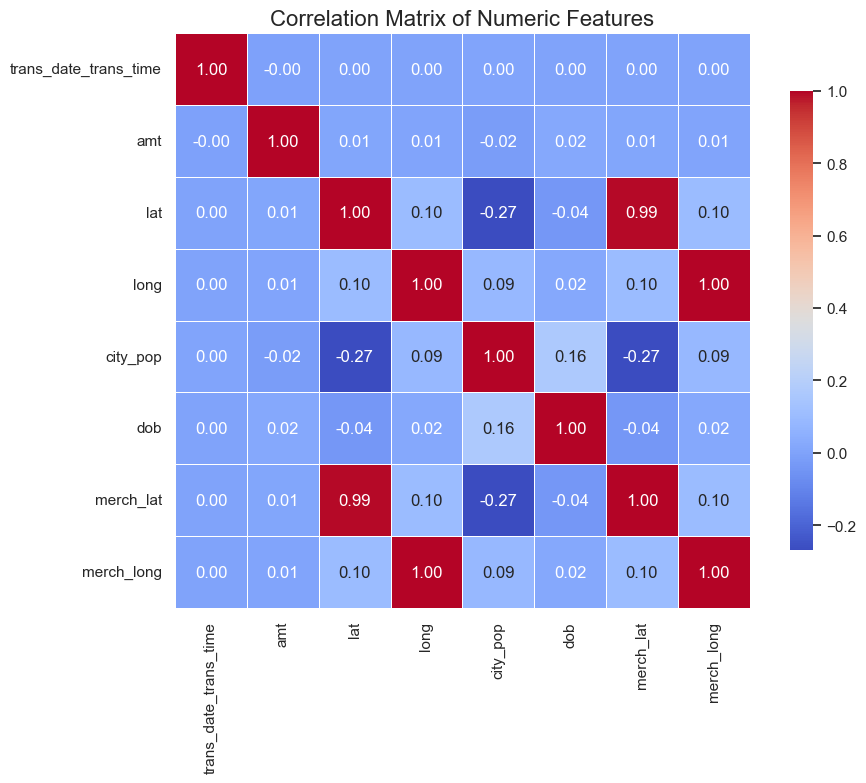

In [28]:
# Subset the DataFrame to include only the numeric features
numerical_data = data[numerical_features]

# Compute the correlation matrix
corr_matrix = numerical_data.corr(method='spearman')

# Set the plot size and style
plt.figure(figsize=(10, 8))
sns.set(style='white')

# Plot the heatmap
sns.heatmap(corr_matrix, 
            annot=True, 
            fmt='.2f', 
            cmap='coolwarm', 
            square=True, 
            linewidths=0.5, 
            cbar_kws={"shrink": .8})

plt.title('Correlation Matrix of Numeric Features', fontsize=16)
plt.tight_layout()
plt.show()

The numerical features are not very correlated between themselves, with only 4 features presenting high correlations with at least one other feature:

- `merch_lat` and `lat` are almost perfectly correlated, presenting a correlation of 0.99.
- `merch_long` and `long` are perfectly correlated, correlation is 1.

In this case, we will need to remove 2 out of these 4 features otherwise our model will suffer of multicolinearity issues, due to the perfect correlations.

__`Step 23`__ Making a pairwise plot of the numerical features.

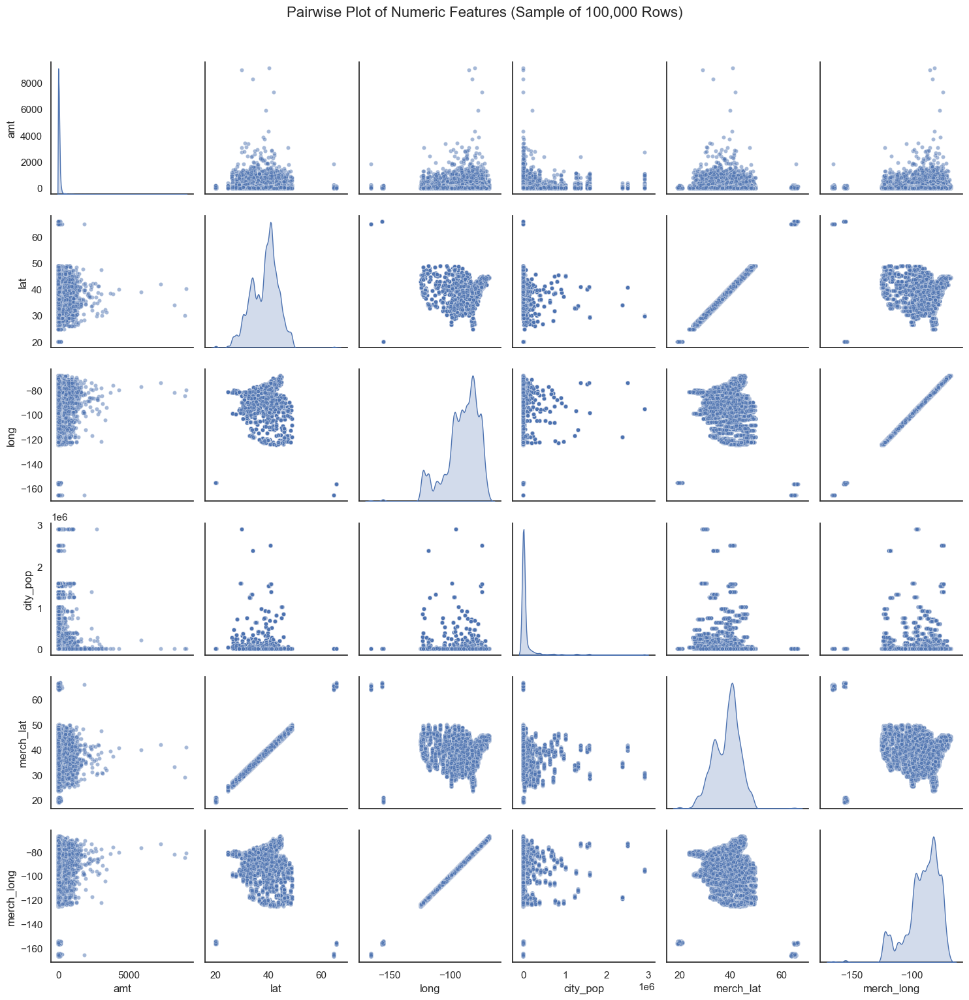

In [30]:
# Subset the data to include only numeric features (you already have this list)
sampled_data = data[numerical_features]

# Set the plot style
sns.set(style='white')

# Create the pairplot (full matrix)
sns.pairplot(sampled_data, diag_kind='kde', plot_kws={'alpha': 0.5, 's': 20})

plt.suptitle('Pairwise Plot of Numeric Features (Sample of 100,000 Rows)', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

__`Step 24`__ Checking the correlation of the numerical features with the target feature.

In [31]:
# Calculate correlation with the target feature
correlations = data[numerical_features + [target_feature]].corr()[target_feature].drop(target_feature)

# Sort correlations by absolute value (optional, for clearer view)
correlations_sorted = correlations.abs().sort_values(ascending=False)

# Display the correlations
print("Correlation of numerical features with the target feature ('is_fraud'):\n")
print(correlations_sorted)

Correlation of numerical features with the target feature ('is_fraud'):

amt                      0.287053
city_pop                 0.035913
merch_long               0.025695
long                     0.025553
dob                      0.024985
trans_date_trans_time    0.008270
lat                      0.001279
merch_lat                0.000846
Name: is_fraud, dtype: float64


The majority of features present a small correlation with the target featue (less than 1%), the only feature that presents some sort of a fairly significant correlation with the target feature is the amount of the transaction (`amt`) with a correlation of 21%.

### 3.6.2. Comparison between categorical features

__`Step 25`__ Computing the Cramér V coefficient to see the association between categorical features. 

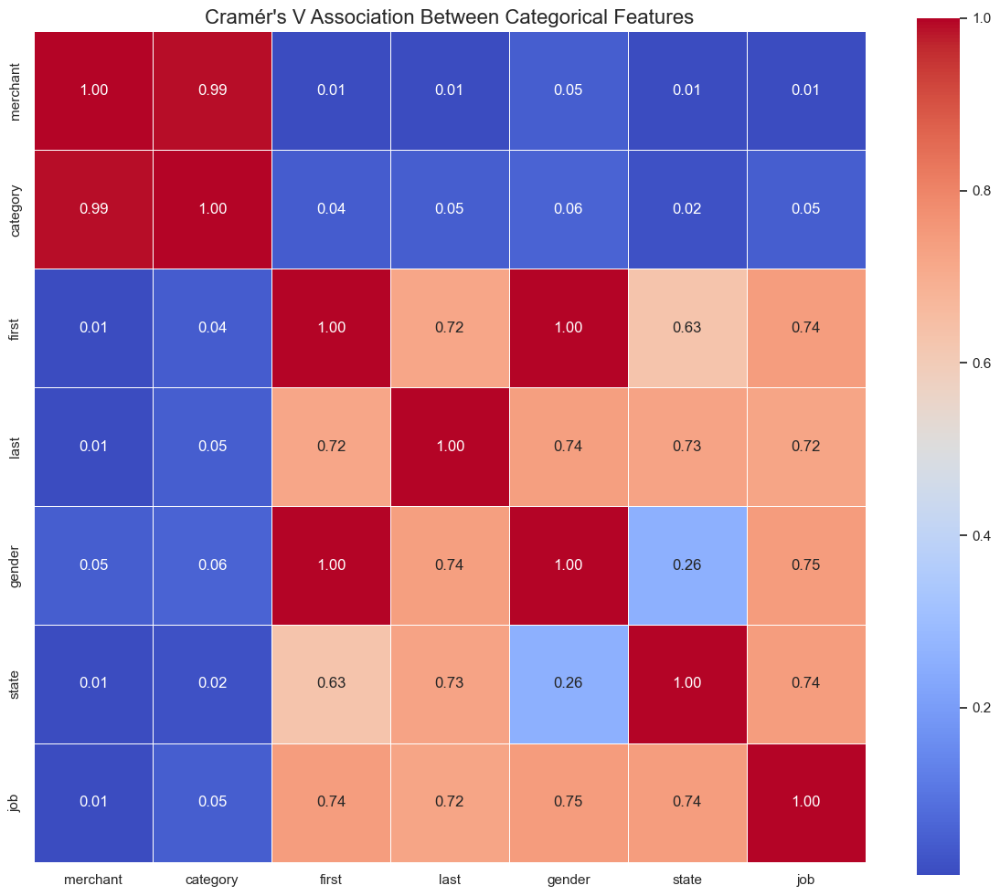

In [32]:
categorical_features_short = ['merchant', 'category', 'first', 'last', 'gender', 'state', 'job']

# Function to compute Cramér's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix, correction=False)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    # Bias correction
    phi2_corr = max(0, phi2 - ((k - 1)*(r - 1))/(n - 1))    
    r_corr = r - ((r - 1)**2)/(n - 1)
    k_corr = k - ((k - 1)**2)/(n - 1)
    return np.sqrt(phi2_corr / min((k_corr - 1), (r_corr - 1)))

# Create empty matrix
cramers_results = pd.DataFrame(index=categorical_features_short, columns=categorical_features_short)

# Fill matrix
for col1 in categorical_features_short:
    for col2 in categorical_features_short:
        if col1 == col2:
            cramers_results.loc[col1, col2] = 1.0
        else:
            try:
                cramers_results.loc[col1, col2] = cramers_v(data[col1], data[col2])
            except:
                cramers_results.loc[col1, col2] = np.nan

# Convert to float for plotting
cramers_results = cramers_results.astype(float)

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(cramers_results, annot=True, fmt='.2f', cmap='coolwarm', square=True, linewidths=0.5)
plt.title("Cramér's V Association Between Categorical Features", fontsize=16)
plt.tight_layout()
plt.show()

The categorical features present some level of association between themselves, with only 4 features presenting almost perfect association with at least one other feature:

- `merchant` and `category` are almost perfectly associated, presenting a cramer coefficient of 0.99.
- `gender` and `first` are perfectly associated, association is 1.

In this case, we will need to remove 2 out of these 4 features otherwise our model will suffer of multicolinearity issues, due to the perfect associations.

__`Step 26`__ Checking the association of the categorical features with the target feature. 

In [33]:
# Calculate Cramér's V for each categorical feature vs is_fraud
cramers_v_scores = {}

for col in categorical_features:
    try:
        v = cramers_v(data[col], data[target_feature])
        cramers_v_scores[col] = round(v, 4)
    except:
        cramers_v_scores[col] = np.nan

# Convert to DataFrame and sort
cramers_v_df = pd.DataFrame.from_dict(cramers_v_scores, orient='index', columns=['Cramér\'s V'])
cramers_v_df = cramers_v_df.sort_values(by="Cramér's V", ascending=False)

# Display
print("Cramér's V between categorical features and the target ('is_fraud'):\n")
print(cramers_v_df)

Cramér's V between categorical features and the target ('is_fraud'):

               Cramér's V
street             0.4898
zip                0.4812
city               0.4366
job                0.3488
last               0.3216
first              0.2534
merch_zipcode      0.1684
state              0.1266
category           0.0856
merchant           0.0807
gender             0.0163
unix_time          0.0000


Concerning the association with the target features we can see that half of them have at least 10% of association with the target.
The ones that present the highest association are: `street` (0.3194), `zip` (0.3152) and `city` (0.2830).

### 3.6.3. Comparing Numerical with categorical features.

__`Step 27`__ Checking the average amount of the transactions per gender.

In [34]:
# Group by gender and calculate the average amount
average_spending_by_gender = data.groupby('gender')['amt'].mean().round(2)

# Display the result
print("Average Spending Amount per Gender:")
print(average_spending_by_gender)

Average Spending Amount per Gender:
gender
F    70.25
M    70.92
Name: amt, dtype: float64


__`Step 27.1`__ Checking the average amount per transaction per state.

In [35]:
# Group by state and calculate average amount
average_spending_by_state = data.groupby('state')['amt'].mean().round(2)

# Display results
print("Average Spending Amount per State:")
print(average_spending_by_state.sort_values(ascending=False))

Average Spending Amount per State:
state
RI    256.27
CO     89.46
FL     84.27
VA     78.42
TN     77.65
PA     77.44
WA     77.44
AZ     76.31
NY     75.90
KY     75.49
AR     75.47
NC     74.66
IL     74.54
OH     73.56
WY     73.07
WV     72.98
VT     72.08
AK     71.98
TX     71.29
LA     70.74
NJ     70.42
ID     69.30
MT     69.06
KS     68.97
MD     68.48
CA     68.13
SC     67.87
MI     67.52
MS     66.65
NM     66.48
OR     66.40
OK     66.15
MA     65.99
WI     64.98
NE     64.92
IN     64.65
DC     64.60
ND     64.54
NH     64.47
SD     64.27
GA     63.78
AL     63.54
MO     63.32
IA     63.08
CT     62.38
MN     60.96
UT     59.97
ME     56.66
NV     43.97
HI     41.49
Name: amt, dtype: float64


__`Step 27.2`__ Checking the average transaction amount per class of the target feature.

In [36]:
# Group by state and calculate average amount
average_spending_by_state = data.groupby('is_fraud')['amt'].mean().round(2)

# Display results
print("Average Spending Amount per State:")
print(average_spending_by_state.sort_values(ascending=False))

Average Spending Amount per State:
is_fraud
1    567.71
0     67.25
Name: amt, dtype: float64


__`Step 27.3`__ Checking the average transfer amount by category.

In [37]:
# Group by state and calculate average amount
average_spending_by_state = data.groupby('category')['amt'].mean().round(2)

# Display results
print("Average Spending Amount per State:")
print(average_spending_by_state.sort_values(ascending=False))

Average Spending Amount per State:
category
grocery_pos       117.46
travel            102.22
shopping_net       94.12
misc_net           82.13
shopping_pos       79.44
entertainment      65.03
gas_transport      63.74
misc_pos           61.16
home               59.01
kids_pets          57.69
grocery_net        54.03
health_fitness     53.90
food_dining        50.54
personal_care      48.24
Name: amt, dtype: float64


__`Step 28`__ Checking the average city population per category of the target feature.

In [38]:
# Group by state and calculate average amount
average_spending_by_state = data.groupby('is_fraud')['city_pop'].mean().round(2)

# Display results
print("Average Spending Amount per State:")
print(average_spending_by_state.sort_values(ascending=False))

Average Spending Amount per State:
is_fraud
1    223258.72
0     88451.35
Name: city_pop, dtype: float64


From this analysis we can depict:

- There is no significant difference in the average transaction amount between females and males.

- Delaware stands out with the highest average transaction amount at $514.49, significantly higher than other states.

- Grocery point-of-sale (grocery_pos) has the highest average transaction amount at $116.96, followed by travel at $111.50, and online shopping (shopping_net) at $88.42.

- The average amount in fraudulent transactions is substantially higher (531.32$) than in non-fraudulent ones (67.67$).

- Fraudulent activities tend to occur more often in cities with higher populations, indicating a potential link between urban areas and fraud risk.